# NCSU GIS/MEA582: Geospatial Modeling and Analysis
## Section 5B Geomorphology II - Spatial and Temporal Terrain Analysis

Setup GRASS GIS Environment

In [17]:
# Import Python standard library and IPython packages we need.
import os
import subprocess
import sys
import csv
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

# Ask GRASS GIS where its Python packages are.
gisbase = subprocess.check_output(["grass", "--config", "path"], text=True).strip()
os.environ["GISBASE"] = gisbase
sys.path.append(os.path.join(gisbase, "etc", "python"))

# Import the GRASS GIS packages we need.
import grass.script as gs
import grass.jupyter as gj

# Start GRASS Session
## Set your grass data location
gj.init("grassdata", "nc_basic_spm_grass7", "user1")


Resources: [GRASS GIS overview and manual](https://ncsu-geoforall-lab.github.io/geospatial-modeling-course/grass/terrain_analysis.html), [GRASSbook](https://grassbook.org/).

### Compute basic topographic parameters: slope and aspect

In [142]:
gs.run_command("g.region", raster="elevation", flags="p")
gs.run_command("r.slope.aspect", elevation="elevation", slope="myslope", aspect="myaspect", overwrite=True)


Display resulting maps with legend

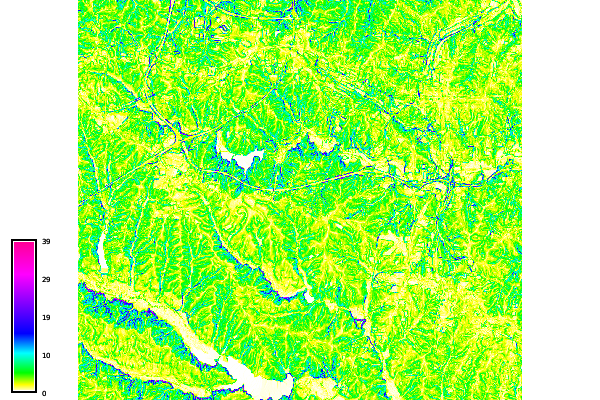

In [143]:
slope_map = gj.GrassRenderer(filename="output/myslope.png")
slope_map.d_rast(map="myslope")
slope_map.d_legend(raster="myslope", at=(2,40,2,6))
slope_map.show()

# slope_map.d_out_file(output="output/myslope.png")

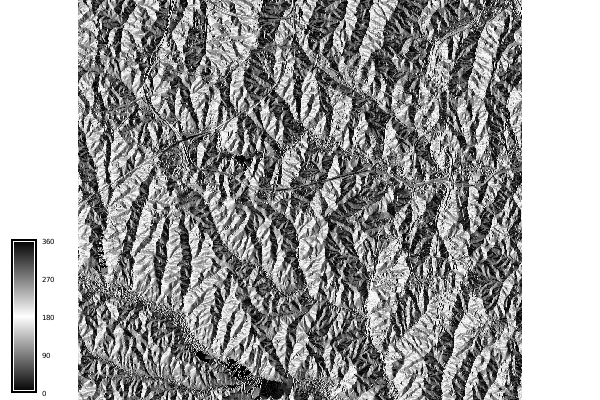

In [144]:
aspect_map = gj.GrassRenderer(filename="output/myaspect.png")
aspect_map.d_rast(map="myaspect")
aspect_map.d_legend(raster="myaspect", at=(2,40,2,6))
aspect_map.show()

Show impact of integer values in meters on slope and aspect pattern.
Compute integer DEM and derive its slope and aspect.
Use GUI to display the histogram: in Map Display > Analyze > Create histogram:

In [31]:
gs.run_command("r.mapcalc", expression="elev_int = int(elevation)")
gs.run_command("r.slope.aspect", elevation="elev_int", aspect="aspect_int_10m", slope="slope_int_10m")

Display historgram of slope

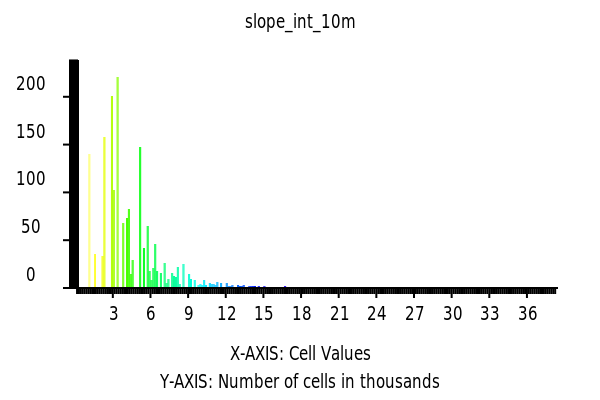

In [145]:
slope_int_10m = gj.GrassRenderer()
slope_int_10m.d_histogram(map="slope_int_10m")
slope_int_10m.show()

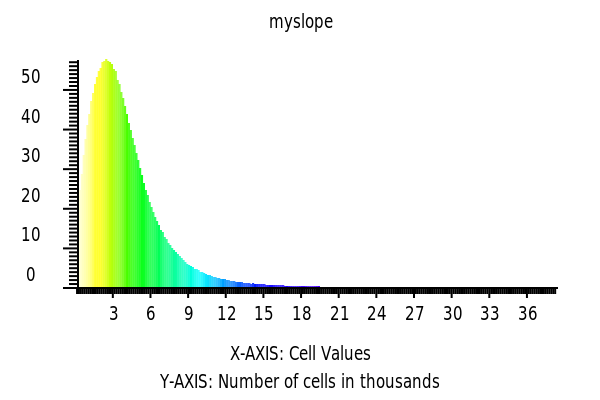

In [33]:
slope_map.d_histogram(map="myslope")
slope_map.show()

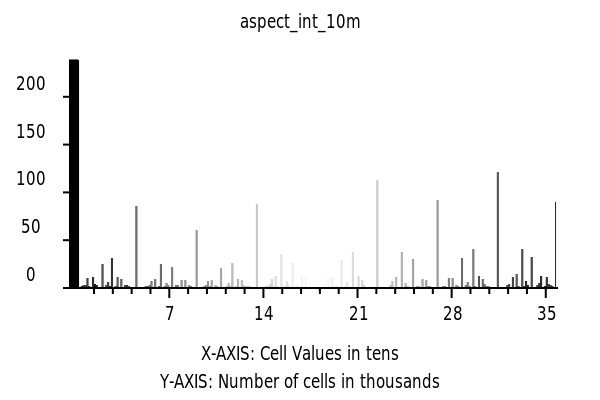

In [34]:
aspect_int_10m = gj.GrassRenderer()
aspect_int_10m.d_histogram(map="aspect_int_10m")
aspect_int_10m.show()


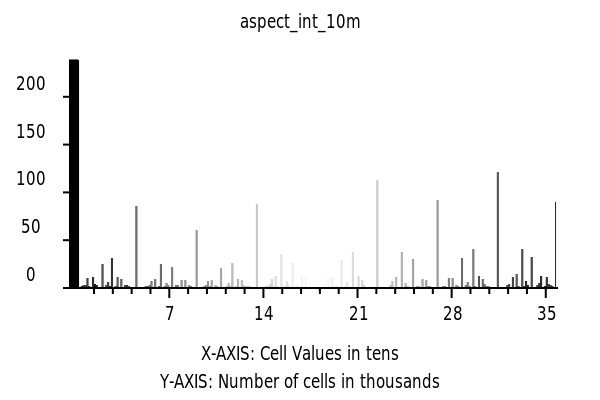

In [35]:
aspect_map.d_histogram(map="aspect_int_10m")
aspect_map.show()

Zoom into NW area of the current region (relatively flat area near large interchange).

**Question**
> Can you explain the difference in slope maps derived from integer (m vertical resolution) and floating point (mm vertical resolution) DEMs?

In [40]:
myslope_map_interactive = gj.InteractiveMap()

# Set opacity to 1.0 (default is 0.8) so that we can see colors clearly
myslope_map_interactive.add_raster("myslope", opacity=1.0)
myslope_map_interactive.add_raster("slope_int_10m", opacity=1.0)
myslope_map_interactive.add_layer_control()

myslope_map_interactive.show()

### Compute slope along road
First set the region to the extent of the bus route #11 and to 10m resolution. Then convert the vector line of the route to raster using the direction of the route.

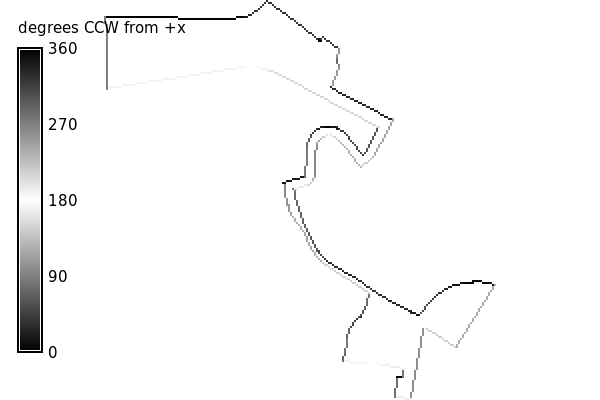

In [44]:
gs.run_command("g.region", vect="busroute11", align="elevation", res=10, flags="p")
gs.run_command("v.to.rast", input="busroute11", type="line", output="busroute11_dir", use="dir")
gs.run_command("r.colors", map="busroute11_dir", color="aspect")
busroute11_dir_map = gj.GrassRenderer()
busroute11_dir_map.d_rast(map="busroute11_dir")
busroute11_dir_map.d_legend(raster="busroute11_dir")
busroute11_dir_map.show()

Compute the steepest slope of the topography along the route by assigning the values of slope derived from a DEM in the first part of this assignment to the grid cells along the route.

In [45]:
gs.run_command("r.mapcalc", expression="route_slope = if(busroute11_dir, myslope)")

Then compute the slope in the direction of the route using the difference between aspect of the topography and the route direction angles.

In [46]:
gs.run_command("r.mapcalc", expression="route_slope_dir = abs(atan(tan(myslope) * cos(myaspect - busroute11_dir)))")
gs.run_command("r.colors", map="route_slope,route_slope_dir", color="slope")

Display the results along with the elevation contours and compute univariate statistics. Comment on the difference of the two results.

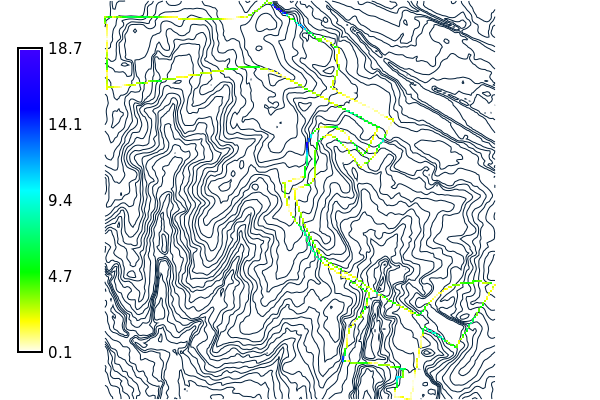

In [66]:
gs.run_command("r.contour", input="elevation", output="contours", step=2)

route_slope_map = gj.GrassRenderer()
route_slope_map.d_vect(map="contours")
route_slope_map.d_rast(map="route_slope")
route_slope_map.d_legend(raster="route_slope")
route_slope_map.show()
# route_slope_map.save(filename="output/route_slope.png")
# d.out.file route_slope


In [70]:
route_slope_raw = gs.parse_command("r.univar", map="route_slope")
tmp = [k.split(':') for k in route_slope_raw.keys()]
route_slope_univ = {}
for i in tmp:
    if len(i) > 1:
        print(f'{i[0]}:{i[1]}')
        route_slope_univ[i[0]] = i[1]
print(route_slope_univ)

total null and non-null cells: 39200
total null cells: 38344
Of the non-null cells:
n: 856
minimum: 0.0775149
maximum: 18.7253
range: 18.6478
mean: 3.61177
mean of absolute values: 3.61177
standard deviation: 2.57539
variance: 6.63265
variation coefficient: 71.3055 %
sum: 3091.67852092534
{'total null and non-null cells': ' 39200', 'total null cells': ' 38344', 'Of the non-null cells': '', 'n': ' 856', 'minimum': ' 0.0775149', 'maximum': ' 18.7253', 'range': ' 18.6478', 'mean': ' 3.61177', 'mean of absolute values': ' 3.61177', 'standard deviation': ' 2.57539', 'variance': ' 6.63265', 'variation coefficient': ' 71.3055 %', 'sum': ' 3091.67852092534'}


In [71]:
route_slope_dir_map = gj.GrassRenderer()
route_slope_dir_map.d_vect(map="contours")
route_slope_dir_map.d_rast(map="route_slope_dir")
route_slope_dir_map.d_legend(raster="route_slope_dir")
route_slope_dir_map.show()
# d.out.file route_slope_dir

total null and non-null cells: 39200
total null cells: 38344
Of the non-null cells:
n: 856
minimum: 0.00219261
maximum: 10.4169
range: 10.4147
mean: 1.86875
mean of absolute values: 1.86875
standard deviation: 1.3932
variance: 1.941
variation coefficient: 74.5523 %
sum: 1599.65282193967
{'total null and non-null cells': ' 39200', 'total null cells': ' 38344', 'Of the non-null cells': '', 'n': ' 856', 'minimum': ' 0.00219261', 'maximum': ' 10.4169', 'range': ' 10.4147', 'mean': ' 1.86875', 'mean of absolute values': ' 1.86875', 'standard deviation': ' 1.3932', 'variance': ' 1.941', 'variation coefficient': ' 74.5523 %', 'sum': ' 1599.65282193967'}


In [127]:
def getUnivarDict(raster):
    dir_raw = gs.parse_command("r.univar", map=raster)
    tmp = [k.split(':') for k in dir_raw.keys()]
    output = {}
    for i in tmp:
        if len(i) > 1:
            print(f'{i[0]}:{i[1]}')
            output[i[0]] = i[1]
    return(output)
    
getUnivarDict("route_slope_dir")

total null and non-null cells: 525000
total null cells: 525000
Of the non-null cells:
n: 0
minimum: -nan
maximum: -nan
range: -nan
mean: -nan
mean of absolute values: -nan
standard deviation: -nan
variance: -nan
variation coefficient: -nan %
sum: -nan


{'total null and non-null cells': ' 525000',
 'total null cells': ' 525000',
 'Of the non-null cells': '',
 'n': ' 0',
 'minimum': ' -nan',
 'maximum': ' -nan',
 'range': ' -nan',
 'mean': ' -nan',
 'mean of absolute values': ' -nan',
 'standard deviation': ' -nan',
 'variance': ' -nan',
 'variation coefficient': ' -nan %',
 'sum': ' -nan'}

### Curvatures
Compute slope, aspect and curvatures simultaneously with interpolation.

You can do the examples below for the bare earth data only (first example),
multiple return example is optional (if you are curious how it differs from BE).

In [84]:
gs.run_command("g.region", region="rural_1m", flags="p")
gs.run_command("v.surf.rst", 
               input="elev_lid792_bepts", 
               elevation="elev_lid_1m", 
               aspect="asp_lid_1m", 
               pcurvature="pc_lid_1m", 
               tcurvature="tc_lid_1m", 
               npmin=120, 
               segmax=25
              )
gs.run_command("v.surf.rst",
               input="elev_lidrural_mrpts",
               elevation="elev_lidmr_1m",
               aspect="asp_lidmr_1m",
               pcurvature="pc_lidmr_1m",
               tcurvature="tc_lidmr_1m",
               npmin=120,
               segmax=25,
               tension=300,
               smooth=1.
              )

Display the results as 2D images or in 3D view.

For 3D view, switch off everything except for elevation surface that you want to view.

Drape topographic parameters raster maps over DEMs as color.

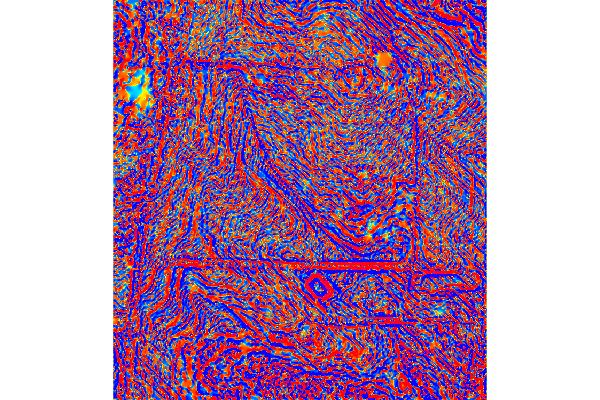

In [85]:
profcurvature1_map = gj.GrassRenderer(filename="output/profcurvature1.png")
profcurvature1_map.d_rast(map="elev_lid_1m")
profcurvature1_map.d_rast(map="pc_lid_1m")
profcurvature1_map.show()
# d.out.file profcurvature1

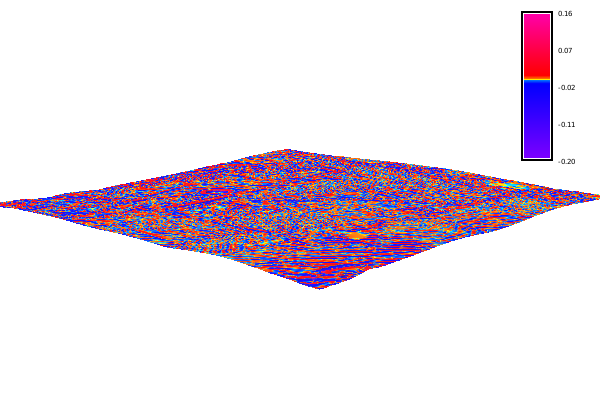

In [89]:
profcurvature1_img = gj.Grass3dRenderer()
profcurvature1_img.render(elevation_map="elev_lid_1m", color_map="pc_lid_1m", perspective=20)
profcurvature1_img.overlay.d_legend(raster="pc_lid_1m", at=(60, 97, 87, 92))
profcurvature1_img.show()

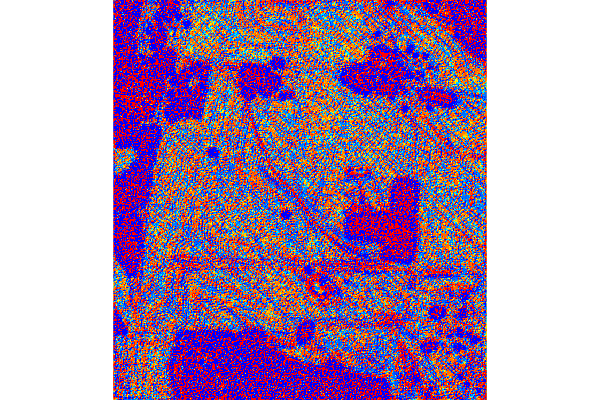

In [97]:
pc_lidmr_1m_map = gj.GrassRenderer()
pc_lidmr_1m_map.d_rast(map="elev_lid_1m")
pc_lidmr_1m_map.d_rast(map="pc_lidmr_1m")
pc_lidmr_1m_map.show()
# d.out.file profcurvature1

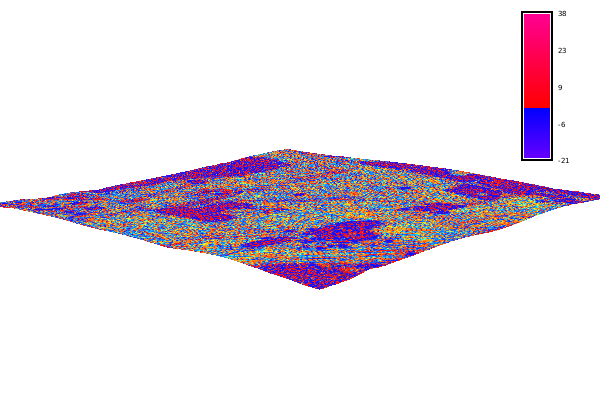

In [98]:
pc_lidmr_1m_img = gj.Grass3dRenderer()
pc_lidmr_1m_img.render(elevation_map="elev_lid_1m", color_map="pc_lidmr_1m", perspective=20)
pc_lidmr_1m_img.overlay.d_legend(raster="pc_lidmr_1m", at=(60, 97, 87, 92))
pc_lidmr_1m_img.show()

The curvature maps reflect survey pattern rather than topographic features.

So we lower the tension and increase the smoothing.

You can use multiple displays to compare the results side-by-side.

In [99]:
gs.run_command("g.region", region="rural_1m", flags="p")
gs.run_command("v.surf.rst", 
               input="elev_lid792_bepts",
               elevation="elev_lidt15_1m",
               aspect="asp_lidt15_1m",
               pcurvature="pc_lidt15_1m",
               tcurvature="tc_lidt15_1m",
               npmin=120,
               segmax=25,
               tension=15,
               smooth=1.
              )
gs.run_command("v.surf.rst",
               input="elev_lidrural_mrpts",
               elevation="elev_lidmrt15_1m",
               aspect="asp_lidmrt15_1m",
               pcurvature="pc_lidmrt15_1m",
               tcurvature="tc_lidmrt15_1m",
               npmin=120,
               segmax=25,
               tension=15,
               smooth=1.
              )

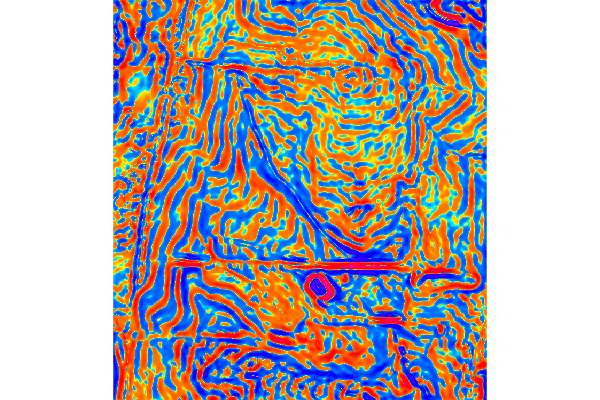

In [100]:
pc_lidt15_1m_map = gj.GrassRenderer()
pc_lidt15_1m_map.d_rast(map="elev_lidt15_1m")
pc_lidt15_1m_map.d_rast(map="pc_lidt15_1m")
pc_lidt15_1m_map.show()
# d.out.file profcurvature1

In [104]:
pc_lidmrt15_1m_map = gj.InteractiveMap()
pc_lidmrt15_1m_map.add_raster("tc_lidt15_1m")
pc_lidmrt15_1m_map.add_raster("elev_lidmrt15_1m")
pc_lidmrt15_1m_map.add_raster("pc_lidmrt15_1m")
pc_lidmrt15_1m_map.add_layer_control()
pc_lidmrt15_1m_map.show()

### Landforms
Extract landforms at different levels of detail by adjusting the size of moving window.

Set rural subregion at 1m resolution, compute landforms using 9m and 45m neighborhood: read the manual to learn more.

**Question**
> Explain types of landforms and the role of the neighborhood size.

In [106]:
gs.run_command("g.region", region="rural_1m", flags="p")
gs.run_command("r.param.scale", input="elev_lid792_1m", output="feature9c_1m", size=9, method="feature")
gs.run_command("r.param.scale", input="elev_lid792_1m", output="feature45c_1m", size=45, method="feature")

Display with legend, save images for the report.

Optionally display the feature maps draped over elev_lid792_1m as color.

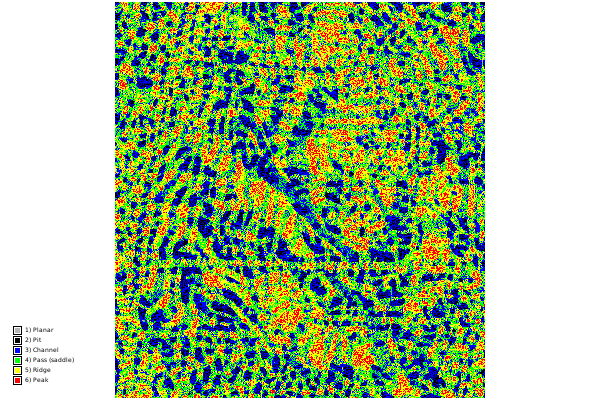

In [107]:
feature9c_1m_map = gj.GrassRenderer()
feature9c_1m_map.d_rast(map="feature9c_1m")
feature9c_1m_map.d_legend(raster="feature9c_1m", at=(2,20,2,6))
feature9c_1m_map.show()

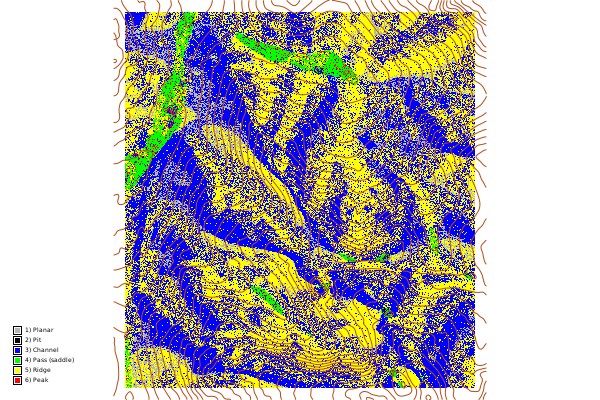

In [108]:
feature45c_1m_map = gj.GrassRenderer()
feature45c_1m_map.d_rast(map="feature45c_1m")
feature45c_1m_map.d_legend(raster="feature45c_1m", at=(2,20,2,6))
feature45c_1m_map.d_vect(map="elev_lid792_cont1m", color="brown")
feature45c_1m_map.show()

### Raster time series analysis

For this exercise we will use NagsHead_series Mapset you downloaded.
You have to first make the mapset accessible.
In GUI: menu Settings -> GRASS working environment -> Mapset access or by using a command:

In [109]:
gs.run_command("g.mapsets", operation="add", mapset="NagsHead_series")

If you don't see the mapset, make sure you downloaded it and unzipped it correctly.

Run the series analysis and explain the results:

**Question**
> Which maps are core and envelope? Which landforms have high standard deviation and what does it mean?

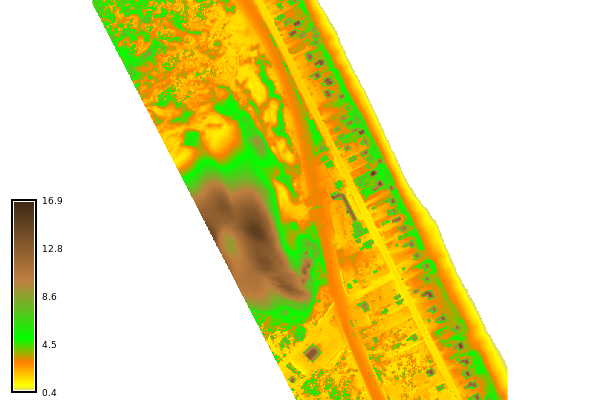

In [112]:
gs.run_command("g.region", raster="NH_2008_1m", flags="p")
NH_2008_1m_map = gj.GrassRenderer()
NH_2008_1m_map.d_rast(map="NH_2008_1m")
NH_2008_1m_map.d_legend(raster="NH_2008_1m", at=(2,50,2,6))
NH_2008_1m_map.show()

In [113]:
series_methods = [('min','minimum'),('max','maximum'),('mintime','min_raster'),('maxtime','max_raster'),('range','range'),('avg','average'),('stddev','stddev')]
for m in series_methods:
    posttext = m[0]
    method = m[1]
    gs.run_command('r.series',
                  input="NH_1999_1m,NH_2001_1m,NH_2004_1m,NH_2005_1m,NH_2007_1m,NH_2008_1m",
                  out=f"NH_9908_{posttext}",
                  method=method
                  )

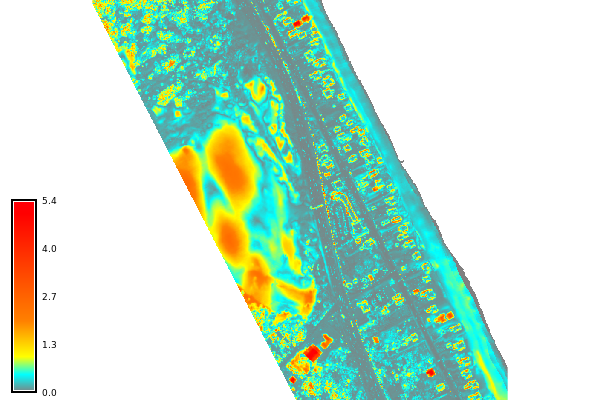

In [114]:
gs.run_command("r.colors", map="NH_9908_stddev", rules="stddev_color.txt")
NH_9908_stddev_map = gj.GrassRenderer()
NH_9908_stddev_map.d_rast(map="NH_9908_stddev")
NH_9908_stddev_map.d_legend(raster="NH_9908_stddev", at=(2,50,2,6))
NH_9908_stddev_map.show()

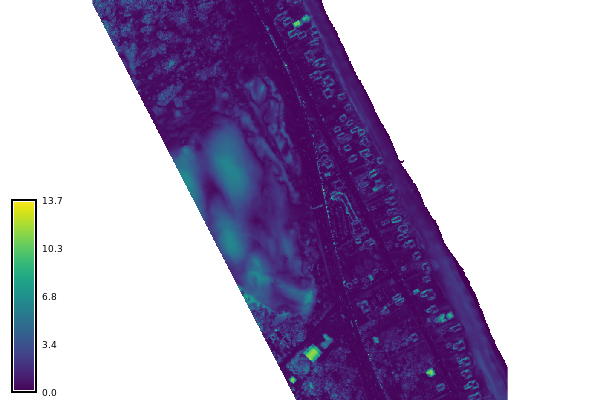

In [116]:
NH_9908_range_map = gj.GrassRenderer(filename="output/NH_9908_range.png")
NH_9908_range_map.d_rast(map="NH_9908_range")
NH_9908_range_map.d_legend(raster="NH_9908_range", at=(2,50,2,6))
NH_9908_range_map.show()

Use cutting plane in 3D view to show the core and envelope.

Add constant elevation plane at -1m for reference, set zexag somewhere 3-5 (the default is too high).

Assign surfaces constant color, use top or bottom surface for crossection color.

When using top for color, lower the light source to make top surface dark and highlight the crossection. Include the output maps and the 3D view with a cutting plane in your report to illustrate the answers to the two questions.

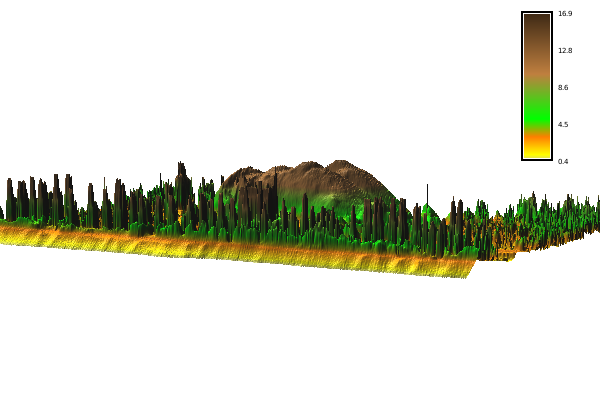

In [120]:
NH_2008_1m_img = gj.Grass3dRenderer()
NH_2008_1m_img.render(elevation_map="NH_2008_1m", color_map="NH_2008_1m", perspective=20)
NH_2008_1m_img.overlay.d_legend(raster="NH_2008_1m", at=(60, 97, 87, 92))
NH_2008_1m_img.show()

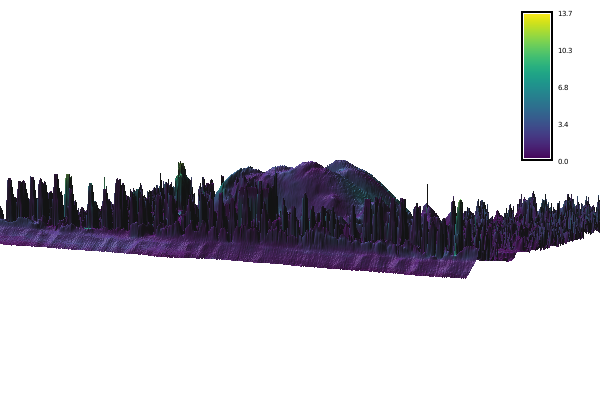

In [121]:
NH_9908_range_img = gj.Grass3dRenderer()
NH_9908_range_img.render(elevation_map="NH_2008_1m", color_map="NH_9908_range", perspective=20)
NH_9908_range_img.overlay.d_legend(raster="NH_9908_range", at=(60, 97, 87, 92))
NH_9908_range_img.show()

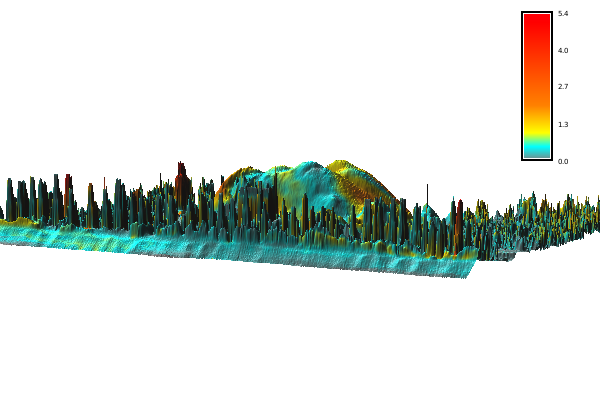

In [122]:
NH_9908_stddev_img = gj.Grass3dRenderer()
NH_9908_stddev_img.render(elevation_map="NH_2008_1m", color_map="NH_9908_stddev", perspective=20)
NH_9908_stddev_img.overlay.d_legend(raster="NH_9908_stddev", at=(60, 97, 87, 92))
NH_9908_stddev_img.show()

### Optional: Cut and fill and volume

Compute cut and fill for 4m deep excavation to build a facility. First, set the region and display facility on top of orthophoto.


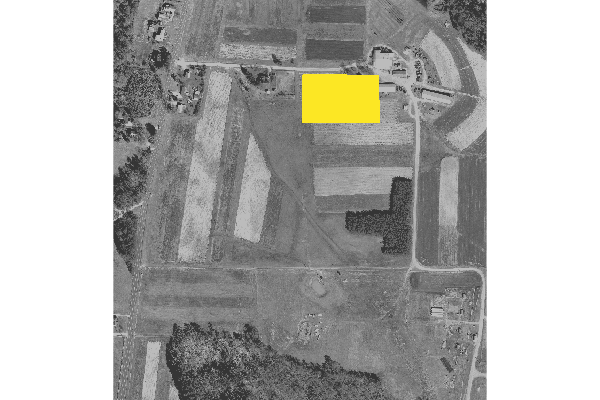

In [125]:
gs.run_command("g.region", region="rural_1m", flags="p")
ortho_2001_t792_1m_map = gj.GrassRenderer()
ortho_2001_t792_1m_map.d_rast(map="ortho_2001_t792_1m")
ortho_2001_t792_1m_map.d_rast(map="facility")
ortho_2001_t792_1m_map.show()

Then set (raster) mask to the facility map and find minimum elevation within the facility:

In [128]:
gs.run_command("r.mask", raster="facility")

In [131]:
facility_univar = getUnivarDict("elevation")

total null and non-null cells: 525000
total null cells: 511870
Of the non-null cells:
n: 13130
minimum: 123.521
maximum: 129.026
range: 5.50497
mean: 127.397
mean of absolute values: 127.397
standard deviation: 1.10801
variance: 1.22768
variation coefficient: 0.86973 %
sum: 1672717.50784302


Minimum which you obtain should be 123.521m. Bottom of 4m excavation will be then

123.52 - 4 = 119.52


In [133]:
print(float(facility_univar['minimum']) - 4.0) 

119.521


Use raster algebra to create the excavation:

In [134]:
gs.run_command("r.mapcalc", expression="excavation = elevation - 119.52")

In [135]:
facility_univar = getUnivarDict("excavation")

total null and non-null cells: 525000
total null cells: 511870
Of the non-null cells:
n: 13130
minimum: 4.00057
maximum: 9.50554
range: 5.50497
mean: 7.87661
mean of absolute values: 7.87661
standard deviation: 1.10801
variance: 1.22768
variation coefficient: 14.0671 %
sum: 103419.907843007


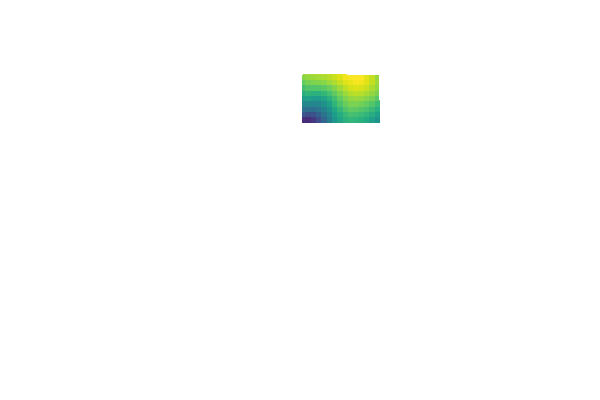

In [136]:
excavation_map = gj.GrassRenderer()
excavation_map.d_rast(map="excavation")
excavation_map.show()

Minimum you get should be 4.00057 and maximum 9.50554. Note that the excavation is limited by the mask we set earlier, so we can now do global operation to compute the volume which applies just the the facility.

In [138]:
gs.parse_command("r.volume", input="excavation")

{'': None,
 'Volume report on data from <excavation> using clumps on <MASK> raster map': None,
 'Category   Average   Data   # Cells        Centroid             Total': None,
 'Number     in clump  Total  in clump   Easting     Northing     Volume': None,
 '-----------------------------------------------------------------------------': None,
 '1      7.88    103420   13130   638725.50   220565.50        103419.91': None,
 'Total Volume': '103419.91'}

Now remove mask. This is important so that your future work is not affected.

In [140]:
gs.run_command("r.mask", flags="r")